<a href="https://colab.research.google.com/github/vbvss199/colab_notebooks/blob/main/miniproj.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install kaggle
!kaggle datasets download -d nitishabharathi/scene-classification
import zipfile

with zipfile.ZipFile('scene-classification.zip', 'r') as zip_ref:
    zip_ref.extractall('scene-classification')



Dataset URL: https://www.kaggle.com/datasets/nitishabharathi/scene-classification
License(s): CC0-1.0
100% 360M/361M [00:17<00:00, 24.2MB/s]
100% 361M/361M [00:17<00:00, 21.7MB/s]


In [ ]:
!pip install Pillow
!pip install onnxruntime

import pandas as pd
import PIL
import sklearn
import torch
import torchvision
import torch.onnx
import onnxruntime

from torchvision import transforms
from torch.utils.data.dataset import Dataset
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from PIL import Image

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 94.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 6.8 MB/s eta 0:00:00


In [ ]:
from pathlib import Path
basePath = '/content/scene-classification/train-scene classification/'
resultPath = '/content/result/'
# adding a folder on kaggle to save models
Path(resultPath).mkdir(exist_ok=True)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
dataPath = basePath + 'train/'
modelPath = resultPath + 'model.pt'
quantizedModelPath = resultPath + 'quantizedModel.pt'
onnxModelPath = resultPath + 'onnxModel.onnx'
onnxQuantizedModelPath = resultPath + 'onnxQuantizedModel.onnx'

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, dataframe, transform):
        self.dataframe = dataframe
        self.transform = transform

    def __getitem__(self,index):
        x = Image.open(dataPath + self.dataframe.iloc[index,0])
        x = self.transform(x)
        y = self.dataframe.iloc[index,1]
        return x,y

    def __len__(self):
        return self.dataframe.shape[0]

In [ ]:
# read file with image names and labels
df = pd.read_csv(basePath + 'train.csv')
# splitting the data into training and testing parts
Train, Validation = train_test_split(df, test_size=0.2, shuffle=True, random_state=5)
df.head()
print("Training set size:", len(Train))
print("Validation set size:", len(Validation))

Training set size: 13627
Validation set size: 3407


In [ ]:
# getting the best weights for the selected model
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
# extract appropriate transformations to be applied to images
auto_transforms = weights.transforms()
# loading the pre-trained convolutional network efficientnet_b0 and changing the classifier to suit the task conditions (6 categories)
model = torchvision.models.efficientnet_b0(weights=weights)
model.classifier[1] = torch.nn.Linear(1280, 6)
model = model.to(device)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 192MB/s]


In [ ]:
# split samples into batches of 64 for upcoming "mini-batch" passes
batch_size = 64
train_set = CustomDataset(Train, transform=auto_transforms)
val_set = CustomDataset(Validation, transform=auto_transforms)
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_set , batch_size=batch_size, shuffle=True)

print('Training set: {}, Validation set: {}'.format(Train.shape[0], Validation.shape[0]))

Training set: 13627, Validation set: 3407


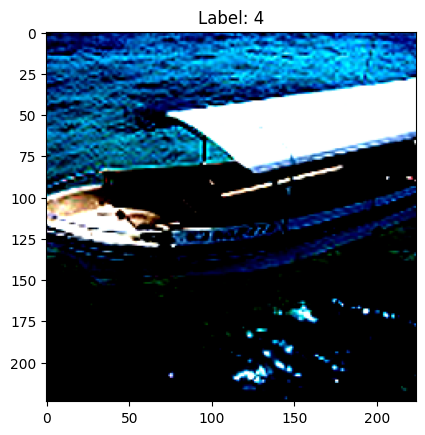

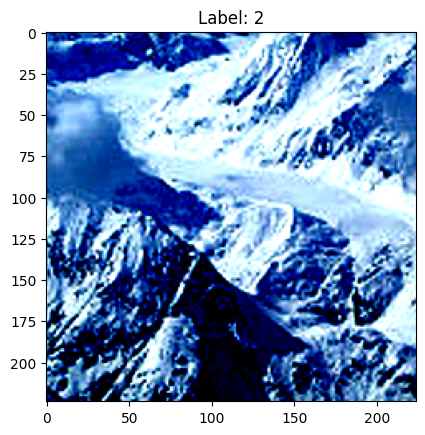

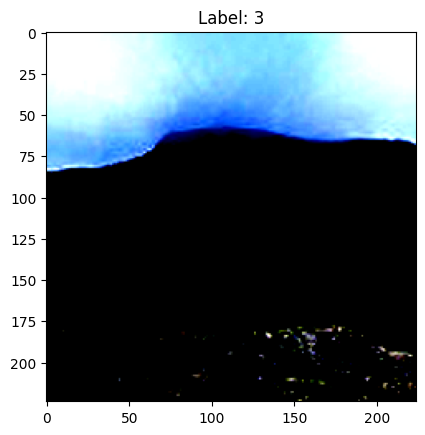

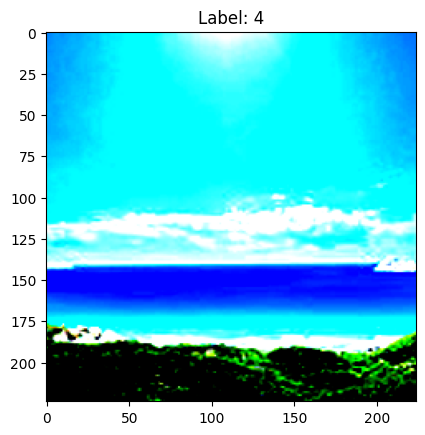

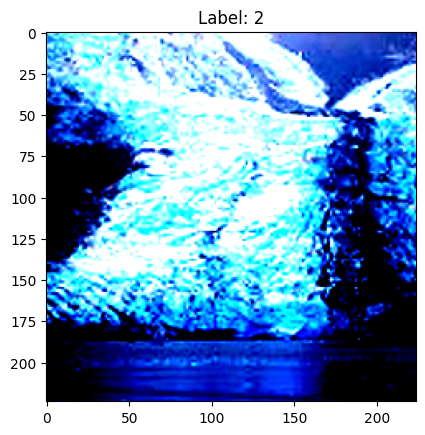

...

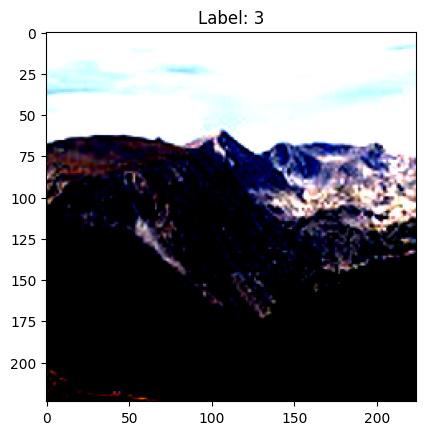

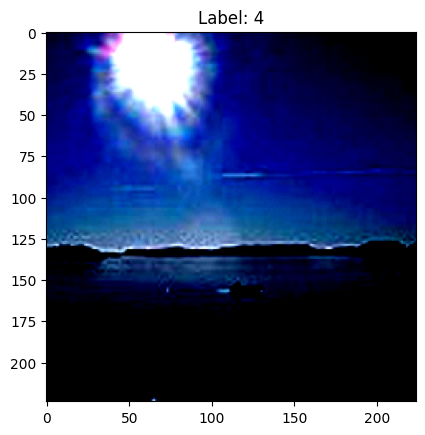

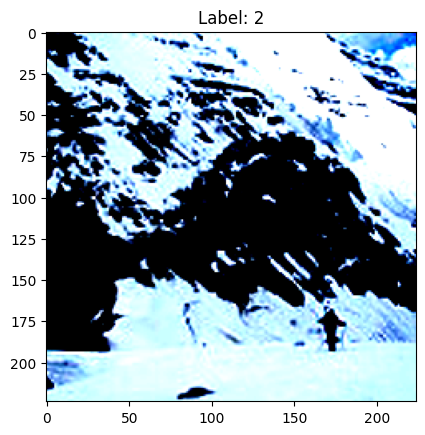

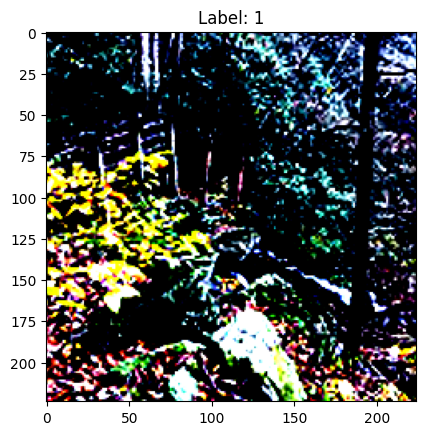

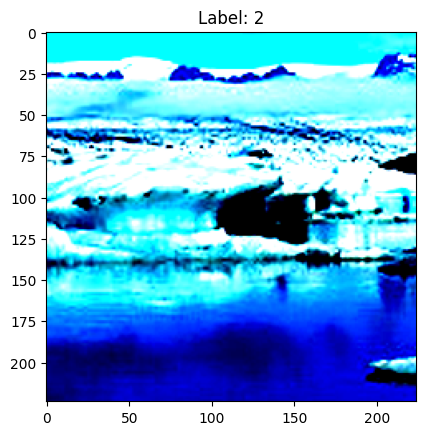

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
%matplotlib inline
# Function to unnormalize and display images and labels
def imshow(img, title=None):
    # Unnormalize
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = img.numpy().transpose((1, 2, 0))
    img = std * img + mean
    img = np.clip(img, 0, 1)

    plt.imshow(img)
    if title is not None:
        plt.title(title)
    plt.axis('off')

# Function to plot images from a DataLoader
def plot_images(loader, title):
    dataiter = iter(train_loader)
    images, labels = next(dataiter)

    # Ensure we plot at least 5 images if available
    num_images = min(5, len(images))
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    for i in range(num_images):
        ax = axes[i]
        imshow(images[i], title=f'{title}: {labels[i].item()}')
        ax.axis('off')
        plt.show()

# Plot images from the train_loader
plot_images(train_loader, title='Train')

# Plot images from the val_loader
plot_images(val_loader, title='Validation')


In [ ]:
# AdamW optimizer and loss functions were used for training - categorical cross-entropy, which is the most suitable for the classification model
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
cost = torch.nn.CrossEntropyLoss()
epochs = 5

for epoch in range(epochs):
    train_loss = 0
    val_loss = 0
    train_correct = 0
    val_correct = 0

   # transfer the model to training mode
    model.train()
    for x, y in train_loader:
        optimizer.zero_grad()
        x,y = x.to(device),y.to(device)

       # calculate prediction and loss
        pred = model(x)
        loss = cost(pred, y)
        train_loss += cost(pred, y).item()
        train_correct += (pred.argmax(1) == y).type(torch.float).sum().item()

       # backpropagation
        loss.backward()
        optimizer.step()

   # switching the model to evaluation mode
    model.eval()
    with torch.no_grad():
        for x, y in val_loader:
            x,y = x.to(device),y.to(device)

            pred = model(x)
            loss = cost(pred, y)
            val_loss += cost(pred, y).item()
            val_correct += (pred.argmax(1) == y).type(torch.float).sum().item()

    train_loss = train_loss/len(train_loader)
    val_loss = val_loss/len(val_loader)
    train_accuracy = train_correct / len(Train)
    val_accuracy = val_correct / len(Validation)

    print("epoch = %d, train_loss = %.5f, val_loss = %.5f, train_accuracy = %.5f, val_accuracy = %.5f" % (epoch, train_loss, val_loss, train_accuracy, val_accuracy))


epoch = 0, train_loss = 0.31095, val_loss = 0.26978, train_accuracy = 0.89528, val_accuracy = 0.91018
epoch = 1, train_loss = 0.20054, val_loss = 0.24643, train_accuracy = 0.92918, val_accuracy = 0.91488
epoch = 2, train_loss = 0.16604, val_loss = 0.21089, train_accuracy = 0.94078, val_accuracy = 0.92486
epoch = 3, train_loss = 0.12896, val_loss = 0.22573, train_accuracy = 0.95494, val_accuracy = 0.91987
epoch = 4, train_loss = 0.10639, val_loss = 0.24090, train_accuracy = 0.96419, val_accuracy = 0.91870


In [ ]:
# saving the model
torch.save(model, modelPath)

In [ ]:
# Преобразование модели PyTorch в формат ONNX
# __________________________________________________________

# генерация входного тензора модели
x = torch.randn(batch_size, 3, 224, 224).to(device)
# экспорт модели с помощью трассировки
torch.onnx.export(model,                     # запускаемая модель
                  x,                         # входные данные модели (или кортеж для нескольких входных данных)
                  onnxModelPath,             # где сохранить модель (может быть файлом или файлоподобным объектом)
                  export_params=True,        # сохранить веса обученных параметров внутри файла модели
                  opset_version=10,          # версия ONNX для экспорта модели
                  do_constant_folding=True,  # следует ли выполнять постоянное сворачивание для оптимизации
                  input_names = ['input'],   # имена входов модели
                  output_names = ['output'], # имена выходов модели
                  dynamic_axes={'input' : {0 : 'batch_size'},    # оси переменной длины
                                'output' : {0 : 'batch_size'}})
# __________________________________________________________

In [ ]:
# Создание квантизированной модели
# __________________________________________________________

# модель квантизации - Eager Mode Quantization, используем динамическую квантизацию после обучения (Post Training Dynamic Quantization)
quantized_model = torch.ao.quantization.quantize_dynamic(
    model,  # the original model
    {torch.nn.Conv2d},  # a set of layers to dynamically quantize
    dtype=torch.qint8)

# сохранение модели
torch.save(quantized_model, quantizedModelPath)
# __________________________________________________________

In [ ]:
# Создание квантизированной ONNX модели
# __________________________________________________________

# генерация входного тензора модели
x = torch.randn(batch_size, 3, 224, 224).to(device)
# экспорт модели с помощью трассировки
torch.onnx.export(quantized_model,           # запускаемая модель
                  x,                         # входные данные модели (или кортеж для нескольких входных данных)
                  onnxQuantizedModelPath,    # где сохранить модель (может быть файлом или файлоподобным объектом)
                  export_params=True,        # сохранить веса обученных параметров внутри файла модели
                  opset_version=10,          # версия ONNX для экспорта модели
                  do_constant_folding=True,  # следует ли выполнять постоянное сворачивание для оптимизации
                  input_names = ['input'],   # имена входов модели
                  output_names = ['output'], # имена выходов модели
                  dynamic_axes={'input' : {0 : 'batch_size'},    # оси переменной длины
                                'output' : {0 : 'batch_size'}})
# __________________________________________________________